In [3]:
!pip install spotipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 7.7 MB/s eta 0:00:00


In [4]:
import spotipy
import pandas as pd
from spotipy.oauth2 import SpotifyOAuth

sp = spotipy.Spotify(auth_manager=SpotifyOAuth(client_id="ed3d020c6e094d5a8849f91575910f06",
                                               client_secret="fe66033f01244fd5b57c70f3f94f1be2",
                                               redirect_uri="https://localhost:8888/callback",
                                               scope="user-library-read", open_browser=False))

In [5]:
def get_playlist_ids(playlist_id): # cf. https://github.com/spotipy-dev/spotipy/issues/246
    r = sp.playlist_tracks(playlist_id)
    t = r['items']
    ids = []
    song_names = []
    artists = []
    popularity = []
    while r['next']:
        r = sp.next(r)
        t.extend(r['items'])
    for s in t:
      ids.append(s["track"]["id"])
      song_names.append(s["track"]['name'])
      artists.append([j['name'] for j in s["track"]['artists']]) if len(s["track"]['artists']) > 1 else artists.append(s["track"]['artists'][0]['name'])
      popularity.append(s["track"]['popularity'])
    return ids, song_names, artists, popularity

def playlist_song_data_extractor(playlist_id):
  from time import sleep
  ids, song_names, song_artists, song_popularity = get_playlist_ids(playlist_id)
  if len(ids) <= 100:
    audio_features = sp.audio_features(tracks=ids)
  else:
    ids = [ids[i:i+100] for i in range(0,len(ids),100)] # cf. https://www.reddit.com/r/learnpython/comments/mdtzqu/comment/gsbcn92/
    audio_features = []
    for i in ids:
      sleep(0.5) # Helps to circumvent hitting the Spotify API's rate limit
      audio_features.append(sp.audio_features(tracks=i))
    audio_features = sum(audio_features, [])
  songs_data = pd.DataFrame.from_dict({n+1: i for n,i in enumerate(audio_features)}, orient='index')
  songs_data.insert(0, "Song Name", song_names, True)
  songs_data.insert(1, "Artist Name", song_artists, True)
  songs_data.insert(2, "popularity", song_popularity, True)
  return songs_data

def description_generator(song_data_frame):
  description = song_data_frame.describe().drop('count')
  song_data_frame_unnested_names = song_data_frame.explode('Artist Name')
  full_description = song_data_frame.describe(include='all')
  full_description['Artist Name'] = song_data_frame_unnested_names.describe(include='all')['Artist Name']
  artist_frequency = song_data_frame_unnested_names['Artist Name'].value_counts()
  return description, full_description, artist_frequency

def complete_generator(id):
  song_data = playlist_song_data_extractor(id)
  description, full_description, artist_frequency = description_generator(song_data)
  return {'song_data': song_data, 'description': description, 'full_description': full_description, 'artist_frequency': artist_frequency}

def ms_to_full(ms):
    sec = ms // 1000
    minute = sec // 60
    rem_sec = sec % 60
    rem_ms = (ms % 60000) - rem_sec*1000
    return f'{str(int(minute)).zfill(2)}:{str(int(rem_sec)).zfill(2)}:{str(int(rem_ms)).zfill(3)}'

def description_matches(song_data_set):
    song_matches = {}
    for i in list(song_data_set['description'].columns):
        song_matches_subset = {}
        for j in list(song_data_set['description'].index):
            song_match = song_data_set['song_data'][i][song_data_set['song_data'][i] == song_data_set['description'][i].loc[j]]
            if song_match.empty == False:
                songs = []
                for k in song_match.index:
                    song_name = song_data_set['song_data'].at[k, 'Song Name']
                    artist_name = song_data_set['song_data'].at[k, 'Artist Name']
                    songs.append(f'{song_name} by {artist_name}')
                    song_match = songs
                song_matches_subset.update({f"{j}": song_match})
        song_matches.update({f"{i}": song_matches_subset})
    return song_matches

def number_to_music_key(number):
    music_keys = {0: "C",
              1: "C#/D♭",
              2: "D",
              3: "D#/E♭",
              4: "E",
              5: "F",
              6: "F#/G♭",
              7: "G",
              8: "G#/A♭",
              9: "A",
              10: "A#/B♭",
              11: "B"}
    if number in [0,1,2,3,4,5,6,7,8,9,10,11]:
      return music_keys[number]
    #elif number > 0 and number < 11:
    #  return f'{number} (appx. {music_keys[round(number)]})'
    else:
      return number

def major_or_minor(binary_num):
  mode = {0: 'minor', 1: 'major'}
  if binary_num != 0 and binary_num != 1:
    #if binary_num > 0 and binary_num < 1:
    #  return f'{binary_num} (appx. {mode[round(binary_num)]})'
    #else:
      return mode[1]
  else:
    return mode[binary_num]

def song_data_formatter(song_data_frame):
  return song_data_frame.rename(columns={'duration_ms': 'duration',
                                         'loudness': 'loudness (dB)'})\
                                        .style.format(formatter={'key': lambda x: number_to_music_key(x),
                                                                 'mode': lambda x: major_or_minor(x),
                                                                 'acousticness': lambda x: f'{x*100:.4f}%',
                                                                 'duration': lambda x: ms_to_full(x),
                                                                 'time_signature': lambda x: f'{x:.2f}/4' if x % 1 != 0.0 else f'{x:.0f}/4',
                                                                 'instrumentalness': lambda x: f'{x*100:.6f}%',
                                                                 'loudness': '{:.3f}',
                                                                 'tempo': lambda x: f'{int(x):.3f}' if x % 1 == 0.0 else f'{x:.3f}'})\
                                                .format(lambda x: f'{x*100:.1f}%', subset=['danceability', 'energy'])\
                                                .format(lambda x: f'{x*100:.2f}%', subset=['speechiness', 'liveness', 'valence'])\
                                                .hide(subset=['type', 'id', 'uri', 'track_href', 'analysis_url'], axis=1)

In [6]:
format = {'key': lambda x: number_to_music_key(x),
'mode': lambda x: major_or_minor(x),
'acousticness': lambda x: f'{x*100:.4f}%',
'duration_ms': lambda x: ms_to_full(x),
'time_signature': lambda x: f'{x:.2f}/4' if x % 1 != 0.0 else f'{x:.0f}/4',
'instrumentalness': lambda x: f'{x*100:.6f}%',
'danceability': lambda x: f'{x*100:.1f}%',
'energy': lambda x: f'{x*100:.1f}%',
'loudness': '{:.3f}',
'tempo': lambda x: f'{int(x):.3f}' if x % 1 == 0.0 else f'{x:.3f}',
'speechiness': lambda x: f'{x*100:.2f}%',
'liveness': lambda x: f'{x*100:.2f}%',
'valence': lambda x: f'{x*100:.2f}%'}
pd.set_option('styler.format.formatter', format)
#pd.reset_option('styler.format.formatter')

In [7]:
# cf. https://www.oreilly.com/library/view/python-cookbook/0596001673/ch17s02.html
try: top_50_global # A continuously-updated playlist of the fifty most popular songs on Spotify
except NameError: top_50_global = None
if top_50_global is None:
    top_50_global = complete_generator("37i9dQZEVXbMDoHDwVN2tF") # https://open.spotify.com/playlist/37i9dQZEVXbMDoHDwVN2tF

Go to the following URL: https://accounts.spotify.com/authorize?client_id=ed3d020c6e094d5a8849f91575910f06&response_type=code&redirect_uri=https%3A%2F%2Flocalhost%3A8888%2Fcallback&scope=user-library-read
Enter the URL you were redirected to: https://localhost:8888/callback?code=AQBYh_6P4pSNt1e3R4UXQHSN1-D7bjxJYrmNkchMoCoaA-DqH4VVcBHpf78BXnEcLPNz-78Mpvf92L7gSouHtbFYuhm_UnKWxmHkz3Prb7C67XV2rCqhqQe-srPDZPud4WxlyZvvIn6EKLhOARaV37TgEJ6yCVCRL4_9n-IoVPfm0h1OlTgYNgJVO5vScwePccCpZtVB


In [8]:
i = top_50_global['song_data'].iloc[:11]
ii = i.explode('Artist Name')
print(ii['Artist Name'].value_counts())
i.describe().drop('count')

Taylor Swift     2
Mariah Carey     1
Wham!            1
Brenda Lee       1
Tate McRae       1
Mitski           1
Jack Harlow      1
Bobby Helms      1
Jung Kook        1
Latto            1
Ariana Grande    1
Name: Artist Name, dtype: int64


,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
mean,94.090909,0.656636,0.569545,5.727273,-7.906818,0.909091,0.058409,0.342409,0.012548,0.159309,0.616545,124.065636,183296.909091,3.727273
std,4.323298,0.170570,0.158270,3.635682,3.683519,0.301511,0.040714,0.280149,0.040623,0.131273,0.288332,34.640580,56824.492078,0.904534
min,86.000000,0.336000,0.308000,0.000000,-14.958000,0.000000,0.027800,0.002600,0.000000,0.065200,0.121000,67.196000,126267.000000,1.000000
25%,91.000000,0.538500,0.448000,2.000000,-8.606000,1.000000,0.034200,0.140500,0.000000,0.086700,0.457000,106.357500,134822.500000,4.000000
50%,95.000000,0.733000,0.598000,7.000000,-7.463000,1.000000,0.044000,0.256000,0.000000,0.111000,0.606000,113.950000,178427.000000,4.000000
75%,97.500000,0.752000,0.664500,8.500000,-5.309000,1.000000,0.054400,0.571500,0.000012,0.157000,0.858000,137.630000,222600.000000,4.000000
max,100.000000,0.943000,0.831000,11.000000,-3.180000,1.000000,0.157000,0.868000,0.135000,0.505000,0.935000,191.900000,277832.000000,4.000000


In [9]:
top_50_global_desc_matches = description_matches(top_50_global)
for i in top_50_global_desc_matches.keys():
  print(f'{i.title()} Matches')
  for j in top_50_global_desc_matches[i]:
    print(j, top_50_global_desc_matches[i][j])

Popularity Matches
min ["Arjan Vailly by ['Manan Bhardwaj', 'Bhupinder Babbal']"]
50% ['Santa Tell Me by Ariana Grande', "QLONA by ['KAROL G', 'Peso Pluma']", "One Of The Girls (with JENNIE, Lily Rose Depp) by ['The Weeknd', 'JENNIE', 'Lily-Rose Depp']", "Starboy by ['The Weeknd', 'Daft Punk']", 'Houdini by Dua Lipa', 'Flowers by Miley Cyrus']
75% ["Rockin' Around The Christmas Tree by Brenda Lee", 'Lovin On Me by Jack Harlow', 'I Wanna Be Yours by Arctic Monkeys', 'Water by Tyla', "Que Onda by ['Calle 24', 'Chino Pacas', 'Fuerza Regida']", "HARLEY QUINN by ['Fuerza Regida', 'Marshmello']", 'LALA by Myke Towers']
max ['greedy by Tate McRae']
Danceability Matches
min ["It's the Most Wonderful Time of the Year by Andy Williams"]
max ['Lovin On Me by Jack Harlow']
Energy Matches
min ['What Was I Made For? [From The Motion Picture "Barbie"] by Billie Eilish']
max ["Que Onda by ['Calle 24', 'Chino Pacas', 'Fuerza Regida']"]
Key Matches
min ['You’re Losing Me (From The Vault) by Taylor Swift

In [10]:
top_50_global['song_data']['key'].value_counts()

2     10
7      5
8      5
9      5
0      5
1      5
6      3
11     3
5      3
4      2
3      2
10     2
Name: key, dtype: int64

In [11]:
pd.DataFrame([number_to_music_key(i) for i in top_50_global['song_data']['key']]).value_counts()

D        10
A         5
C         5
C#/D♭     5
G         5
G#/A♭     5
B         3
F         3
F#/G♭     3
A#/B♭     2
D#/E♭     2
E         2
dtype: int64

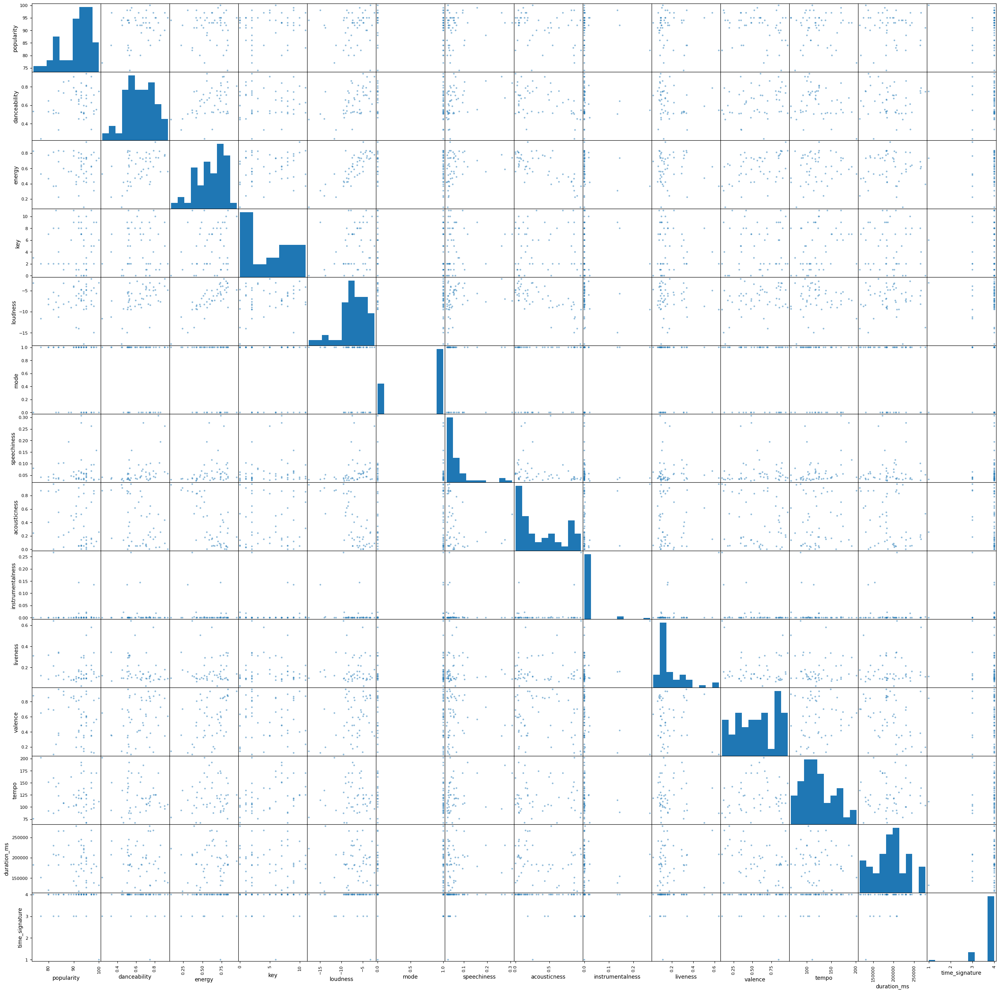

In [12]:
from pandas.plotting import scatter_matrix
scatter_matrix(top_50_global['song_data'], figsize=(32,32));

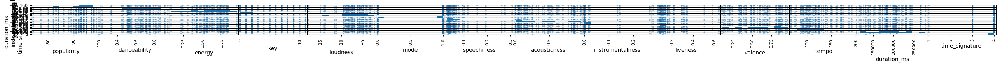

In [42]:
shrunk_scatter_t50H = scatter_matrix(top_50_global['song_data'], figsize=(32,1));

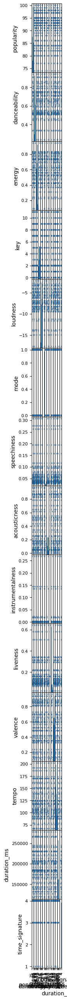

In [43]:
shrunk_scatter_t50V = scatter_matrix(top_50_global['song_data'], figsize=(1,32));

In [13]:
try: some_favorites # Thomas Holtz's personal playlist
except NameError: some_favorites = None
if some_favorites is None:
    some_favorites = complete_generator("4VTmuzJb0KFDU2q53yFxHp") # https://open.spotify.com/playlist/4VTmuzJb0KFDU2q53yFxHp

In [14]:
some_favorites_desc_matches = description_matches(some_favorites)
for i in some_favorites_desc_matches.keys():
  print(f'{i.title()} Matches')
  for j in some_favorites_desc_matches[i]:
    print(j, some_favorites_desc_matches[i][j])

Popularity Matches
min ['100 Years by Five For Fighting', '20K by Pegboard Nerds', 'Adventure Time by Rogue', 'Airbag by Radiohead', 'Andicuri by Joe Pisapia', 'Andrew Eldritch Is Moving Back to Leeds by The Mountain Goats', 'Ano Nagarus by Group Inerane', 'Another Day (Original Mix) by TVDS', 'Antihero by Noisestorm', 'Aphasia by Mr FijiWiji', 'Apollo - Electro Mix by Astronaut', 'Aura by Telepathics', 'BAD NEWS by Rituals of Mine', 'BADBOI by Pegboard Nerds', 'Be Still by Becca Stevens', "Believe (feat. Connor Zwetsch) by ['Trivecta', 'Connor Zwetsch']", 'Belle Isle - Without Overdubs, Self Portrait by Bob Dylan', 'Better With Time by Grabbitz', 'Bloom by Radiohead', "Boy and the Beast by ['Puppet', 'Pierce Fulton']", "Break Over You by ['Draper', 'Prides']", 'Bron-Yr-Aur - 1993 Remaster by Led Zeppelin', 'Build the Cities [Classical] by Karma Fields', 'Burn the Witch by Radiohead', "Busy Earnin' by Jungle", 'Captivating by Neilio', 'Careful by Guster', 'Casio by Jungle', "Champions 

In [15]:
some_favorites['song_data']['key'].value_counts()

7     90
0     80
2     78
9     76
5     73
11    67
1     65
4     50
10    48
8     46
6     41
3     15
Name: key, dtype: int64

In [16]:
pd.DataFrame([number_to_music_key(i) for i in some_favorites['song_data']['key']]).value_counts()

G        90
C        80
D        78
A        76
F        73
B        67
C#/D♭    65
E        50
A#/B♭    48
G#/A♭    46
F#/G♭    41
D#/E♭    15
dtype: int64

In [17]:
some_favorites['song_data'][some_favorites['song_data']['key'] == 3]

,Song Name,Artist Name,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
41,Bad Day,Daniel Powter,76,0.599,0.7850,3,-4.013,1,0.0309,0.4480,...,0.1510,0.520,140.046,audio_features,0mUyMawtxj1CJ76kn9gIZK,spotify:track:0mUyMawtxj1CJ76kn9gIZK,https://api.spotify.com/v1/tracks/0mUyMawtxj1C...,https://api.spotify.com/v1/audio-analysis/0mUy...,233640,4
51,Beautiful Dreamer,"[Stephen Foster, Thomas Hampson]",10,0.377,0.0696,3,-21.138,1,0.0524,0.9800,...,0.0933,0.339,77.339,audio_features,4N6hfXvM2VJ6lw7C7MVo23,spotify:track:4N6hfXvM2VJ6lw7C7MVo23,https://api.spotify.com/v1/tracks/4N6hfXvM2VJ6...,https://api.spotify.com/v1/audio-analysis/4N6h...,233573,4
91,Buona Sera - Remastered 2002,"[Louis Prima, Keely Smith, Sam Butera & The Wi...",52,0.544,0.4590,3,-8.069,1,0.0524,0.6890,...,0.0346,0.850,99.175,audio_features,7LYfx4uOewuMJnkAN4xHlj,spotify:track:7LYfx4uOewuMJnkAN4xHlj,https://api.spotify.com/v1/tracks/7LYfx4uOewuM...,https://api.spotify.com/v1/audio-analysis/7LYf...,180093,4
104,Catch You,Kill Paris,27,0.590,0.8290,3,-4.710,0,0.0716,0.0504,...,0.0233,0.402,109.898,audio_features,1y8QMxR3O00rnkN0FKeMtB,spotify:track:1y8QMxR3O00rnkN0FKeMtB,https://api.spotify.com/v1/tracks/1y8QMxR3O00r...,https://api.spotify.com/v1/audio-analysis/1y8Q...,214240,4
107,' Cello Song,Nick Drake,55,0.507,0.3900,3,-17.218,1,0.0326,0.6570,...,0.0613,0.520,118.805,audio_features,42yexCY4dCftowtAZXuAIj,spotify:track:42yexCY4dCftowtAZXuAIj,https://api.spotify.com/v1/tracks/42yexCY4dCft...,https://api.spotify.com/v1/audio-analysis/42ye...,284987,4
175,Eh Cumpari,Julius LaRosa,30,0.842,0.3110,3,-9.776,1,0.0689,0.8560,...,0.0719,0.780,132.114,audio_features,6ydDMTSuSv3wqRgzfam46S,spotify:track:6ydDMTSuSv3wqRgzfam46S,https://api.spotify.com/v1/tracks/6ydDMTSuSv3w...,https://api.spotify.com/v1/audio-analysis/6ydD...,148067,4
201,Firelight,Young the Giant,44,0.300,0.2840,3,-13.061,0,0.0307,0.9200,...,0.1000,0.173,188.203,audio_features,2bBQg0zLuhXcVvqSSriawP,spotify:track:2bBQg0zLuhXcVvqSSriawP,https://api.spotify.com/v1/tracks/2bBQg0zLuhXc...,https://api.spotify.com/v1/audio-analysis/2bBQ...,333987,4
307,Idioteque,Radiohead,0,0.615,0.9310,3,-7.800,1,0.2400,0.0352,...,0.0914,0.530,137.544,audio_features,7xqeIdLJSf3bgmZ7vUvHrE,spotify:track:7xqeIdLJSf3bgmZ7vUvHrE,https://api.spotify.com/v1/tracks/7xqeIdLJSf3b...,https://api.spotify.com/v1/audio-analysis/7xqe...,309093,3
324,Into the Limelight (feat. Danyka Nadeau),"[Trivecta, Danyka]",0,0.522,0.9310,3,-4.646,1,0.0616,0.0935,...,0.1030,0.457,127.928,audio_features,6VkVzHGvYvcKT6aiAE19ue,spotify:track:6VkVzHGvYvcKT6aiAE19ue,https://api.spotify.com/v1/tracks/6VkVzHGvYvcK...,https://api.spotify.com/v1/audio-analysis/6VkV...,270000,4
350,Kiss Me,Sixpence None The Richer,83,0.526,0.7490,3,-6.964,1,0.0283,0.0230,...,0.0692,0.421,99.982,audio_features,754kgU5rWscRTfvlsuEwFp,spotify:track:754kgU5rWscRTfvlsuEwFp,https://api.spotify.com/v1/tracks/754kgU5rWscR...,https://api.spotify.com/v1/audio-analysis/754k...,208680,4


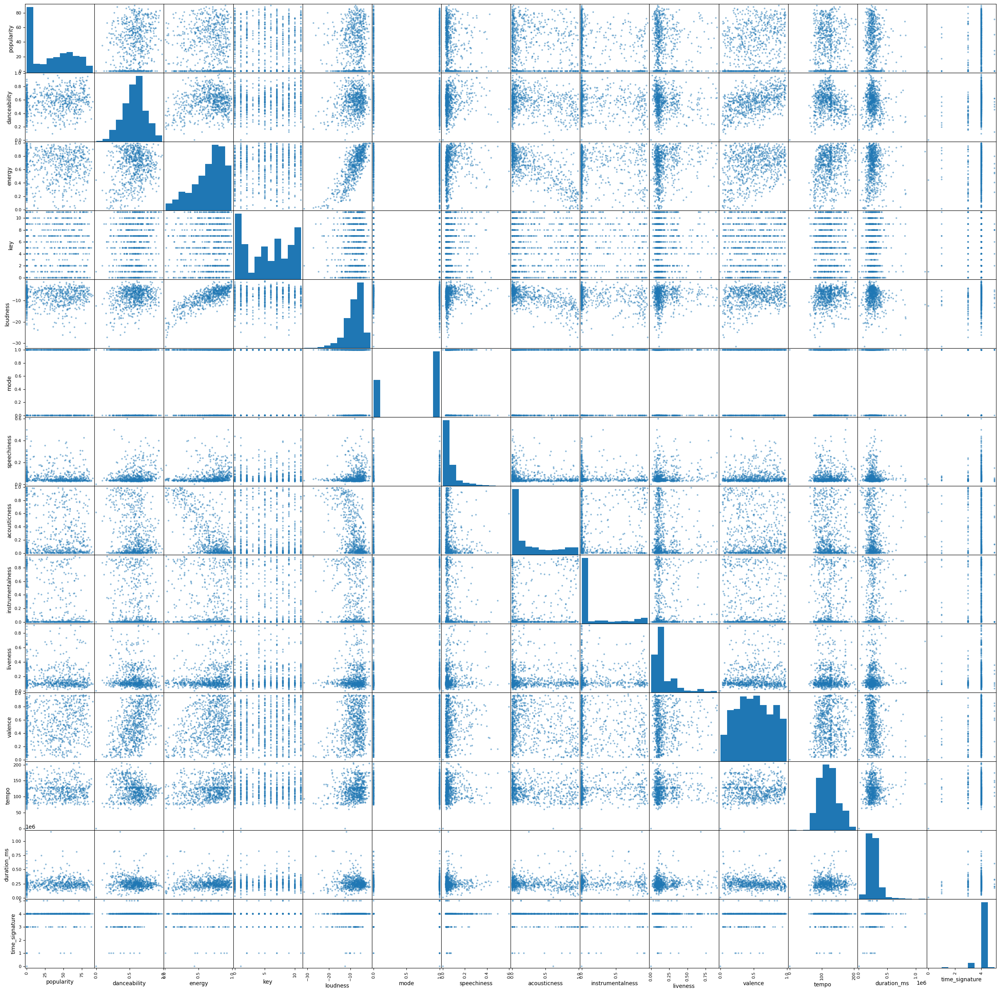

In [25]:
scatter_matrix(some_favorites['song_data'], figsize=(32,32));

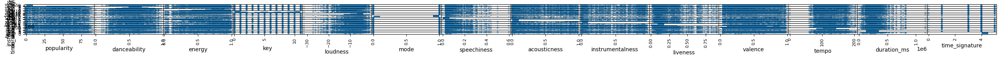

In [44]:
shrunk_scatter_SVH = scatter_matrix(some_favorites['song_data'], figsize=(32,1));

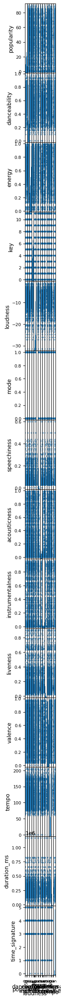

In [45]:
shrunk_scatter_SVV = scatter_matrix(some_favorites['song_data'], figsize=(1,32));

In [20]:
try: ten_thousand_songs # A playlist with ten thousand songs
except NameError: ten_thousand_songs = None
if ten_thousand_songs is None:
    ten_thousand_songs = complete_generator('32twOqGf8gIswTgzG3IKxP') #https://open.spotify.com/playlist/32twOqGf8gIswTgzG3IKxP

In [22]:
ten_thousand_songs['description'].style

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
mean,17.345018,51.6%,69.3%,5.289334001001502,-7.644,major,6.37%,20.7110%,10.035134%,20.66%,48.47%,124.207,04:07:568,3.92/4
std,23.504595,15.9%,23.9%,3.525194263933296,3.803,major,6.36%,28.3598%,23.441363%,18.21%,24.85%,29.158,01:21:800,0.33/4
min,0.000000,6.3%,0.0%,C,-34.486,minor,2.25%,0.0000%,0.000000%,1.36%,2.92%,45.212,00:35:587,0/4
25%,0.000000,40.8%,52.7%,D,-9.638,minor,3.27%,0.2830%,0.000157%,9.62%,28.50%,101.936,03:21:787,4/4
50%,0.000000,51.9%,74.6%,F,-6.770,major,4.21%,5.2600%,0.024800%,13.30%,47.20%,122.531,03:56:133,4/4
75%,38.000000,62.6%,89.9%,G#/A♭,-4.848,major,6.82%,32.7000%,2.480000%,26.90%,68.20%,143.012,04:36:827,4/4
max,92.000000,97.8%,99.9%,B,1.275,major,95.40%,99.6000%,98.700000%,99.80%,98.50%,219.993,28:14:907,5/4


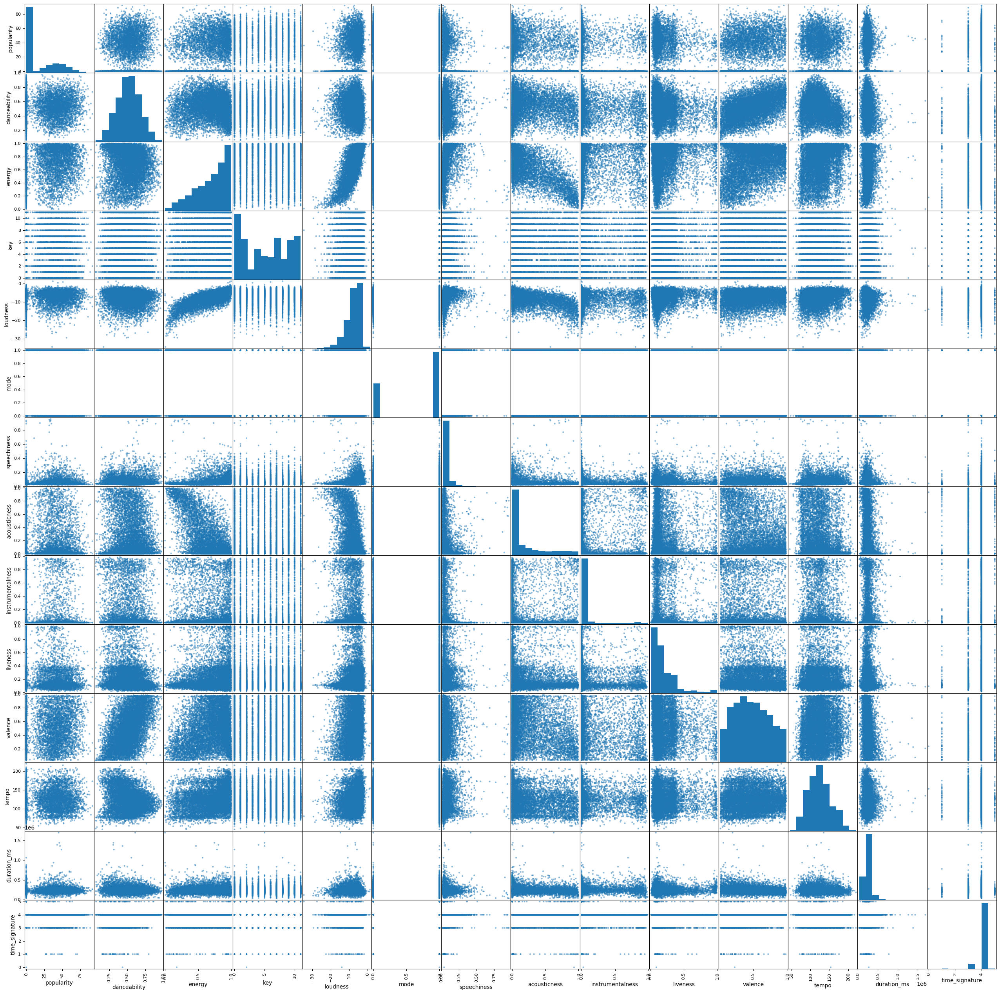

In [23]:
scatter_matrix(ten_thousand_songs['song_data'], figsize=(32,32));

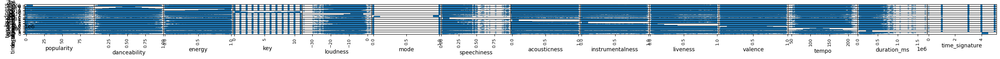

In [46]:
shrunk_scatter_TTSH = scatter_matrix(ten_thousand_songs['song_data'], figsize=(32,1));

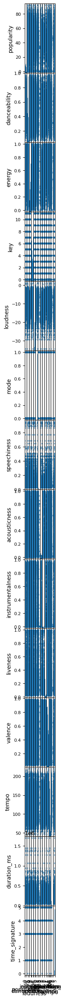

In [47]:
shrunk_scatter_TTSV = scatter_matrix(ten_thousand_songs['song_data'], figsize=(1,32));

In [24]:
try: boom_boom_boom_boom # Playlist with 10951 instances of "Boom, Boom, Boom, Boom!!" by Vengaboys
except NameError: boom_boom_boom_boom = None
if boom_boom_boom_boom is None:
    boom_boom_boom_boom = complete_generator('5SwCIuMKEF1lzt1mBUXS0K') # https://open.spotify.com/playlist/5iE2JHPVhuTCNfxS4FZW1r

In [26]:
print(len(boom_boom_boom_boom['song_data']))
boom_boom_boom_boom['description'].style

10951


,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
mean,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
std,0.000000,0.0%,0.0%,C,0.000,minor,0.00%,0.0000%,0.000000%,0.00%,0.00%,0.000,00:00:000,0/4
min,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
25%,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
50%,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
75%,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4
max,0.000000,80.1%,94.7%,B,-4.624,minor,3.87%,1.1800%,42.700000%,2.48%,96.80%,138.489,03:22:583,4/4


/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:92: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[i])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:101: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[j])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:102: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:116: RuntimeWarning: invalid value encountered in divide
  adj = (locs - lim1[0]) / (lim1[1] - lim1[0])


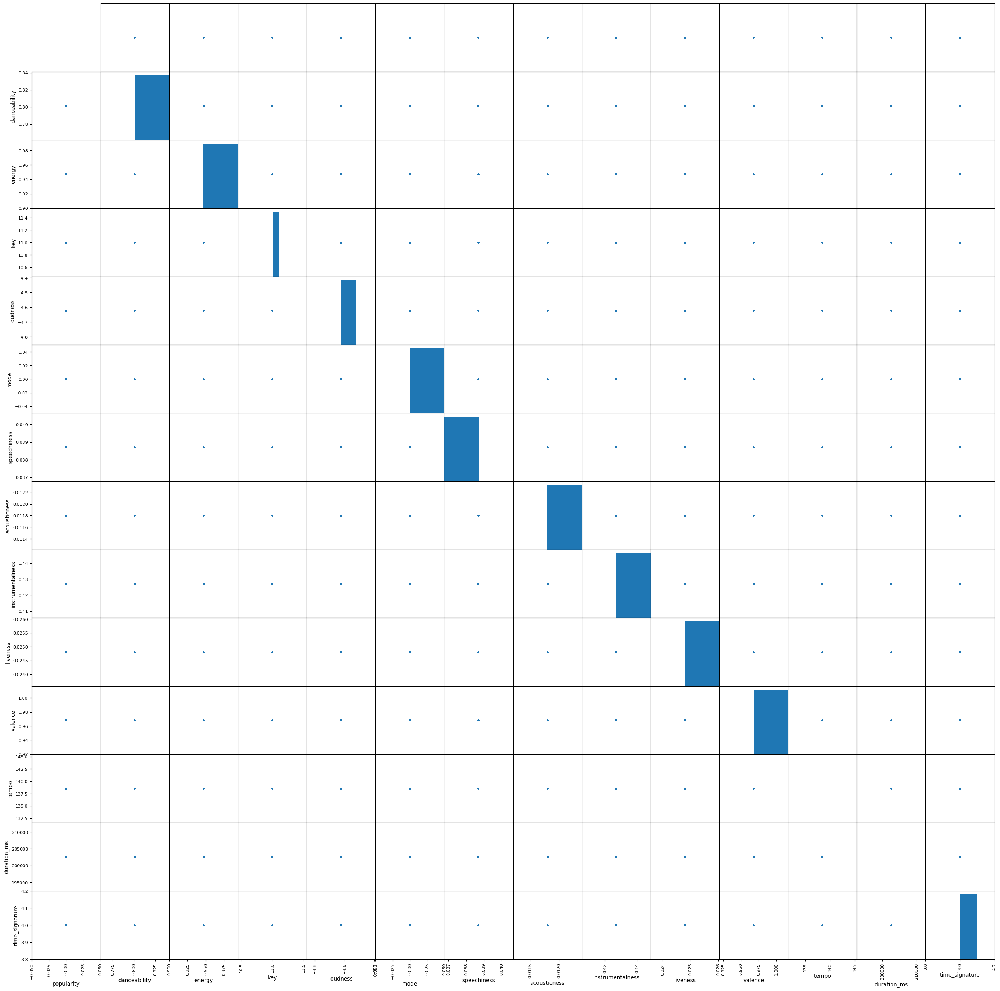

In [27]:
scatter_matrix(boom_boom_boom_boom['song_data'], figsize=(32,32));

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:92: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[i])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:101: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[j])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:102: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:116: RuntimeWarning: invalid value encountered in divide
  adj = (locs - lim1[0]) / (lim1[1] - lim1[0])


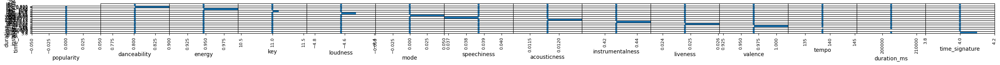

In [48]:
shrunk_scatter_BBBBV = scatter_matrix(boom_boom_boom_boom['song_data'], figsize=(32,1));

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:92: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[i])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:101: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[j])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:102: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:116: RuntimeWarning: invalid value encountered in divide
  adj = (locs - lim1[0]) / (lim1[1] - lim1[0])


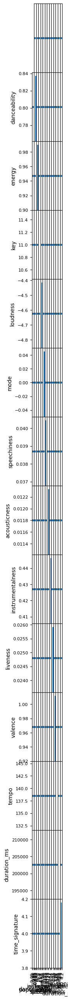

In [41]:
shrunk_scatter_BBBBV = scatter_matrix(boom_boom_boom_boom['song_data'], figsize=(1,32));

In [29]:
Song_data = top_50_global['song_data']
Song_data

,Song Name,Artist Name,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
1,All I Want for Christmas Is You,Mariah Carey,97,0.336,0.6270,7,-7.463,1,0.0384,0.16400,...,0.0708,0.350,150.273,audio_features,0bYg9bo50gSsH3LtXe2SQn,spotify:track:0bYg9bo50gSsH3LtXe2SQn,https://api.spotify.com/v1/tracks/0bYg9bo50gSs...,https://api.spotify.com/v1/audio-analysis/0bYg...,241107,4
2,Last Christmas - Single Version,Wham!,86,0.733,0.5980,2,-8.228,1,0.0278,0.21200,...,0.1560,0.935,107.732,audio_features,06qMRF18gwbOYYbnP2du6i,spotify:track:06qMRF18gwbOYYbnP2du6i,https://api.spotify.com/v1/tracks/06qMRF18gwbO...,https://api.spotify.com/v1/audio-analysis/06qM...,265960,4
3,Rockin' Around The Christmas Tree,Brenda Lee,95,0.589,0.4720,8,-8.749,1,0.0502,0.61400,...,0.5050,0.898,67.196,audio_features,2EjXfH91m7f8HiJN1yQg97,spotify:track:2EjXfH91m7f8HiJN1yQg97,https://api.spotify.com/v1/tracks/2EjXfH91m7f8...,https://api.spotify.com/v1/audio-analysis/2EjX...,126267,4
4,greedy,Tate McRae,100,0.750,0.7330,6,-3.180,0,0.0319,0.25600,...,0.1140,0.844,111.018,audio_features,3rUGC1vUpkDG9CZFHMur1t,spotify:track:3rUGC1vUpkDG9CZFHMur1t,https://api.spotify.com/v1/tracks/3rUGC1vUpkDG...,https://api.spotify.com/v1/audio-analysis/3rUG...,131872,1
5,My Love Mine All Mine,Mitski,98,0.504,0.3080,9,-14.958,1,0.0321,0.86800,...,0.1580,0.121,113.950,audio_features,3vkCueOmm7xQDoJ17W1Pm3,spotify:track:3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,https://api.spotify.com/v1/audio-analysis/3vkC...,137773,4
6,Cruel Summer,Taylor Swift,99,0.552,0.7020,9,-5.707,1,0.1570,0.11700,...,0.1050,0.564,169.994,audio_features,1BxfuPKGuaTgP7aM0Bbdwr,spotify:track:1BxfuPKGuaTgP7aM0Bbdwr,https://api.spotify.com/v1/tracks/1BxfuPKGuaTg...,https://api.spotify.com/v1/audio-analysis/1Bxf...,178427,4
7,Lovin On Me,Jack Harlow,95,0.943,0.5580,2,-4.911,1,0.0568,0.00260,...,0.0937,0.606,104.983,audio_features,4xhsWYTOGcal8zt0J161CU,spotify:track:4xhsWYTOGcal8zt0J161CU,https://api.spotify.com/v1/tracks/4xhsWYTOGcal...,https://api.spotify.com/v1/audio-analysis/4xhs...,138411,4
8,Jingle Bell Rock,Bobby Helms,91,0.754,0.4240,2,-8.463,1,0.0363,0.64300,...,0.0652,0.806,119.705,audio_features,7vQbuQcyTflfCIOu3Uzzya,spotify:track:7vQbuQcyTflfCIOu3Uzzya,https://api.spotify.com/v1/tracks/7vQbuQcyTflf...,https://api.spotify.com/v1/audio-analysis/7vQb...,130973,4
9,Seven (feat. Latto) (Explicit Ver.),"[Jung Kook, Latto]",90,0.790,0.8310,11,-4.185,1,0.0440,0.31200,...,0.0797,0.872,124.987,audio_features,2HRgqmZQC0MC7GeNuDIXHN,spotify:track:2HRgqmZQC0MC7GeNuDIXHN,https://api.spotify.com/v1/tracks/2HRgqmZQC0MC...,https://api.spotify.com/v1/audio-analysis/2HRg...,183551,4
10,Santa Tell Me,Ariana Grande,93,0.525,0.6210,7,-7.364,1,0.1160,0.04890,...,0.2940,0.591,191.900,audio_features,0lizgQ7Qw35od7CYaoMBZb,spotify:track:0lizgQ7Qw35od7CYaoMBZb,https://api.spotify.com/v1/tracks/0lizgQ7Qw35o...,https://api.spotify.com/v1/audio-analysis/0liz...,204093,4


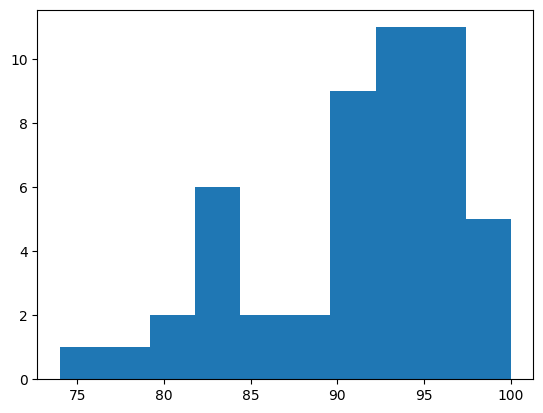

In [30]:
Song_data
#Histogram
import matplotlib.pyplot as plt
plt.hist(Song_data['popularity'])
plt.show()

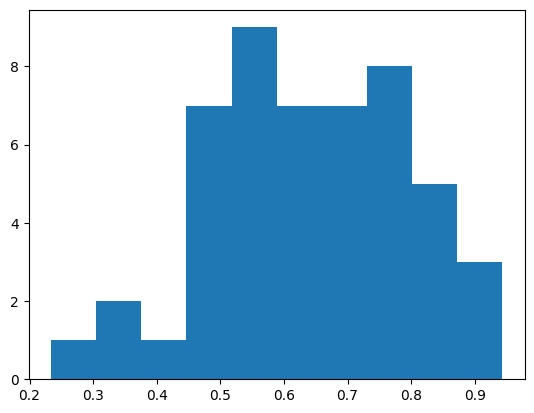

In [49]:
Song_data
#Histogram
import matplotlib.pyplot as plt
plt.hist(Song_data['danceability'])
plt.show()

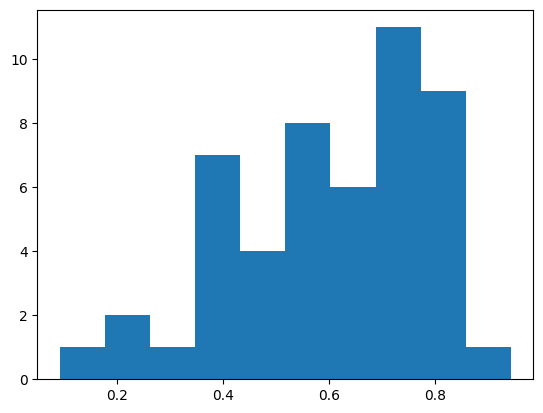

In [50]:
Song_data
#Histogram
import matplotlib.pyplot as plt
plt.hist(Song_data['energy'])
plt.show()

In [ ]:
#It seems popularity correlates with energy

In [31]:
#Bar chart
import pandas as pd
Song_data.head()

,Song Name,Artist Name,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
1,All I Want for Christmas Is You,Mariah Carey,97,0.336,0.627,7,-7.463,1,0.0384,0.164,...,0.0708,0.350,150.273,audio_features,0bYg9bo50gSsH3LtXe2SQn,spotify:track:0bYg9bo50gSsH3LtXe2SQn,https://api.spotify.com/v1/tracks/0bYg9bo50gSs...,https://api.spotify.com/v1/audio-analysis/0bYg...,241107,4
2,Last Christmas - Single Version,Wham!,86,0.733,0.598,2,-8.228,1,0.0278,0.212,...,0.1560,0.935,107.732,audio_features,06qMRF18gwbOYYbnP2du6i,spotify:track:06qMRF18gwbOYYbnP2du6i,https://api.spotify.com/v1/tracks/06qMRF18gwbO...,https://api.spotify.com/v1/audio-analysis/06qM...,265960,4
3,Rockin' Around The Christmas Tree,Brenda Lee,95,0.589,0.472,8,-8.749,1,0.0502,0.614,...,0.5050,0.898,67.196,audio_features,2EjXfH91m7f8HiJN1yQg97,spotify:track:2EjXfH91m7f8HiJN1yQg97,https://api.spotify.com/v1/tracks/2EjXfH91m7f8...,https://api.spotify.com/v1/audio-analysis/2EjX...,126267,4
4,greedy,Tate McRae,100,0.750,0.733,6,-3.180,0,0.0319,0.256,...,0.1140,0.844,111.018,audio_features,3rUGC1vUpkDG9CZFHMur1t,spotify:track:3rUGC1vUpkDG9CZFHMur1t,https://api.spotify.com/v1/tracks/3rUGC1vUpkDG...,https://api.spotify.com/v1/audio-analysis/3rUG...,131872,1
5,My Love Mine All Mine,Mitski,98,0.504,0.308,9,-14.958,1,0.0321,0.868,...,0.1580,0.121,113.950,audio_features,3vkCueOmm7xQDoJ17W1Pm3,spotify:track:3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,https://api.spotify.com/v1/audio-analysis/3vkC...,137773,4


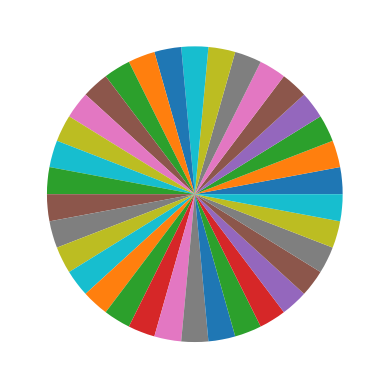

In [32]:
#Pie Chart
import matplotlib.pyplot as plt
import numpy as np

Song_data

plt.pie(Song_data['mode'])
plt.show()

In [33]:
import numpy as np

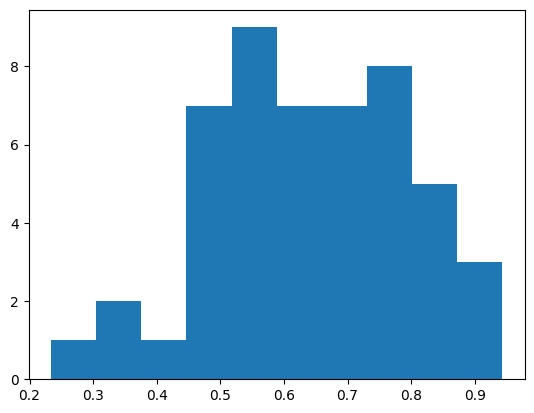

In [34]:
import matplotlib.pyplot as plt
plt.hist(Song_data['danceability'])
plt.show()

In [35]:
## cf. https://stackoverflow.com/a/1546245, https://stackoverflow.com/a/3939381
# id = str(input("Enter playlist ID: "))
# name = __import__('re').sub("\s\s+" , " ", sp.playlist(id)['name'].translate(dict.fromkeys(map(ord, __import__('string').punctuation), None))).replace(' ', '_').lower()
# print(f"Your playlist data set will be called '{name}'.")
# exec(name + " = complete_generator(id)")

In [36]:
# top_50_global['song_data'].explode('Artist Name')[top_50_global['song_data'].explode('Artist Name')['Artist Name'] == 'Jung Kook']

In [40]:
# Spotipy's audio_features() function does not work on this playlist, probably because it has no name.
try: willis_orr_record
except NameError: willis_orr_record = None
if willis_orr_record is None:
    willis_orr_record = complete_generator('5S8SJdl1BDc0ugpkEvFsIL') #https://open.spotify.com/playlist/5S8SJdl1BDc0ugpkEvFsIL

TypeError: ignored

In [ ]:
#top_50_songs_data[["danceability","energy","speechiness","acousticness","instrumentalness","liveness","valence"]] = top_50_songs_data[["danceability","energy","speechiness","acousticness","instrumentalness","liveness","valence"]] * 100
#top_50_songs_data["danceability"] = top_50_songs_data["danceability"].apply(lambda x: f'{x:.1f}%')
#top_50_songs_data[["energy","speechiness","liveness","valence"]] = top_50_songs_data[["energy","speechiness","liveness","valence"]].applymap(lambda x: f'{x:.2f}%')
#top_50_songs_data[["acousticness","instrumentalness"]] = top_50_songs_data[["acousticness","instrumentalness"]].applymap(lambda x: f'{x:.4f}%')
#top_50_songs_data['duration_ms'] = top_50_songs_data['duration_ms'].apply(lambda x: ms_to_full(x))